In [1]:
import cv2
from skimage.segmentation import clear_border
import matplotlib.pyplot as plt
import numpy as np
import time
import glob 

#### Image read

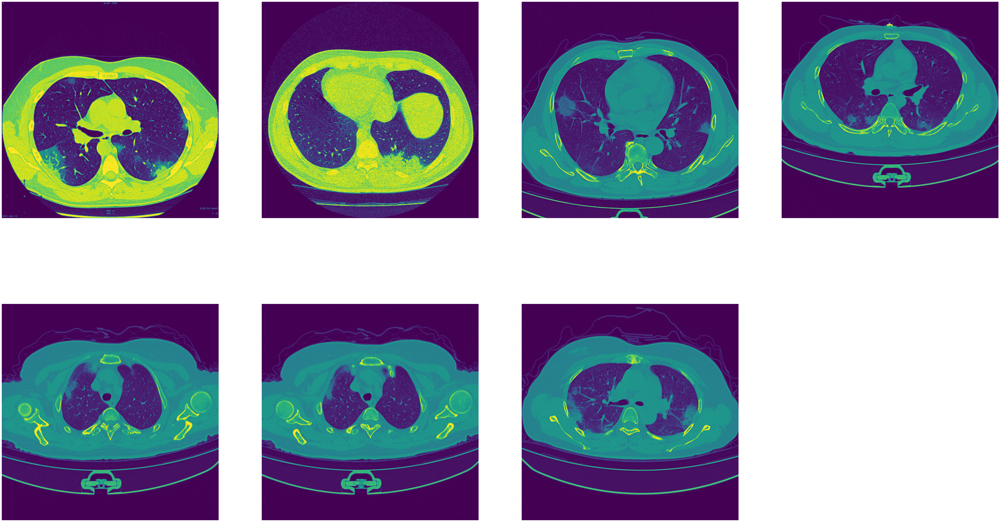

In [2]:
img = [cv2.imread(file,0) for file in glob.glob('C:/Users/Debprasad Kundu/Downloads/Question3//**/ct*',recursive=True)]

fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(img)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img[i])
    plt.axis('off')

#### Image segmentation using Otsu

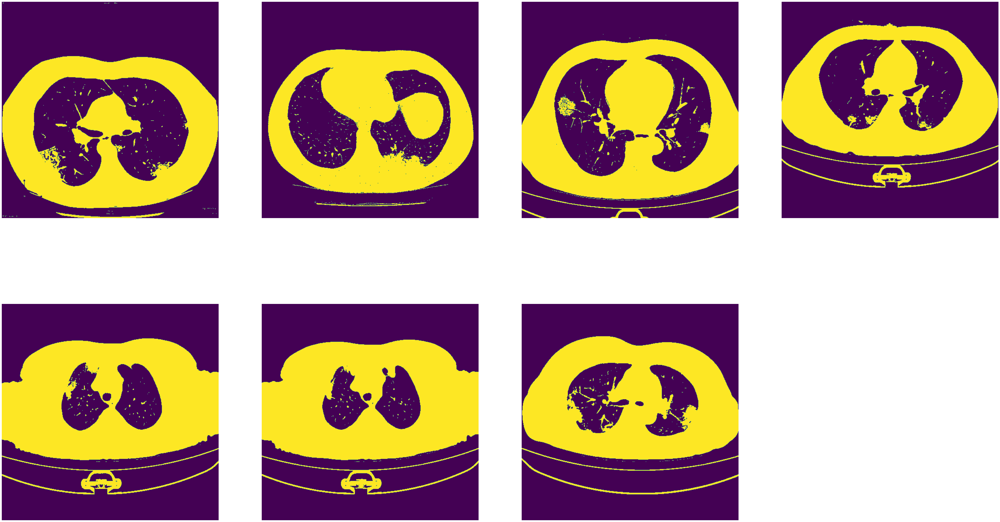

In [3]:
th,otsu_img = [], []

for item in img:
    th_item,otsu_img_item = cv2.threshold(item,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    th.append(th_item)
    otsu_img.append(otsu_img_item)
    
fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(otsu_img)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(otsu_img[i])
    plt.axis('off')

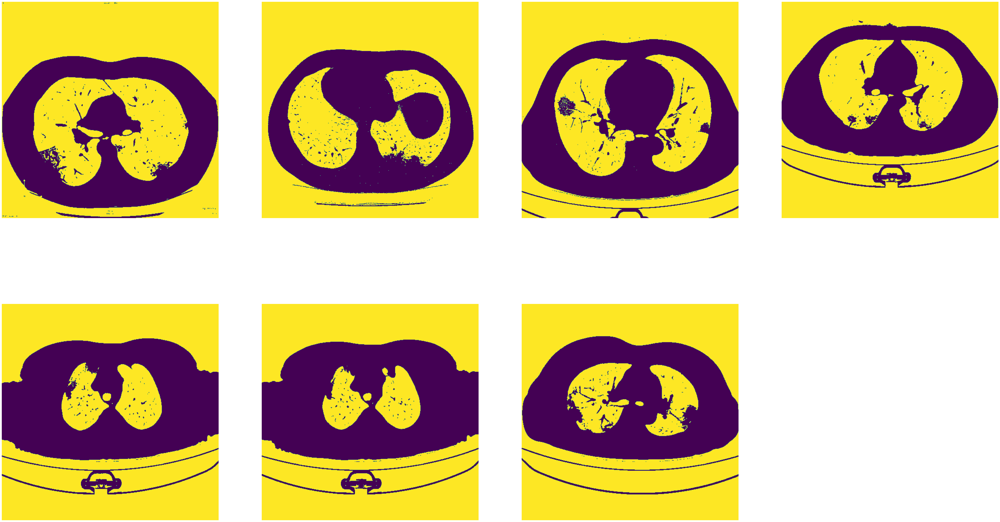

In [4]:
img2 = []

for item in otsu_img:
    img2.append(255-item)
    
fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(img2)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img2[i])
    plt.axis('off')

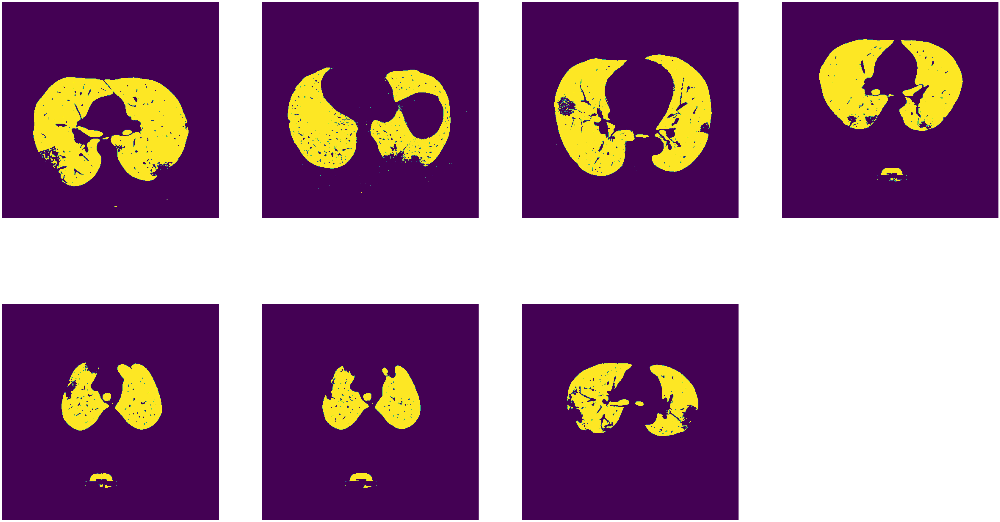

In [5]:
img3 = []
for item in img2:
    img3.append(clear_border(item))
    
fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(img3)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img3[i])
    plt.axis('off')

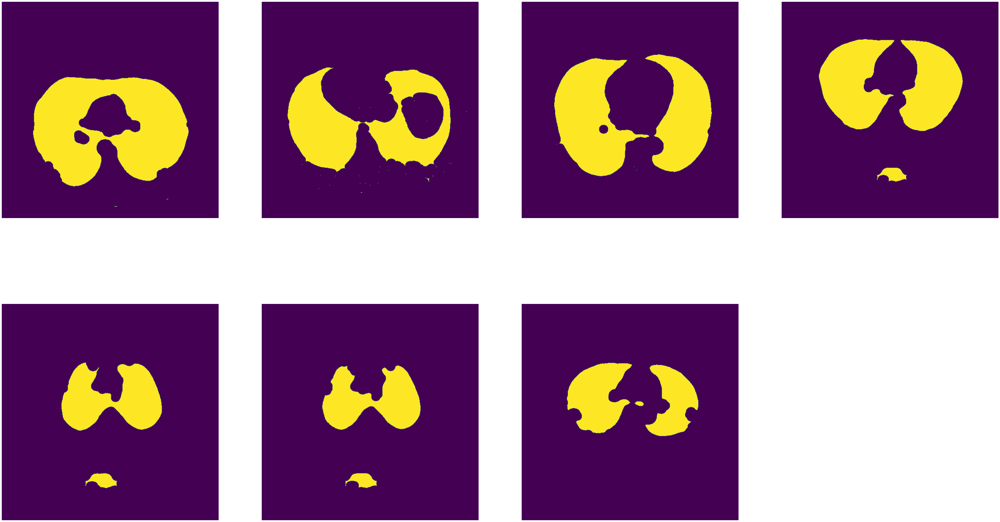

In [6]:
se_fill = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(21,21))
img3_fill = []
for item in img3:
    img3_fill.append(cv2.morphologyEx(item, cv2.MORPH_CLOSE, se_fill))

fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(img3_fill)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img3_fill[i])
    plt.axis('off')

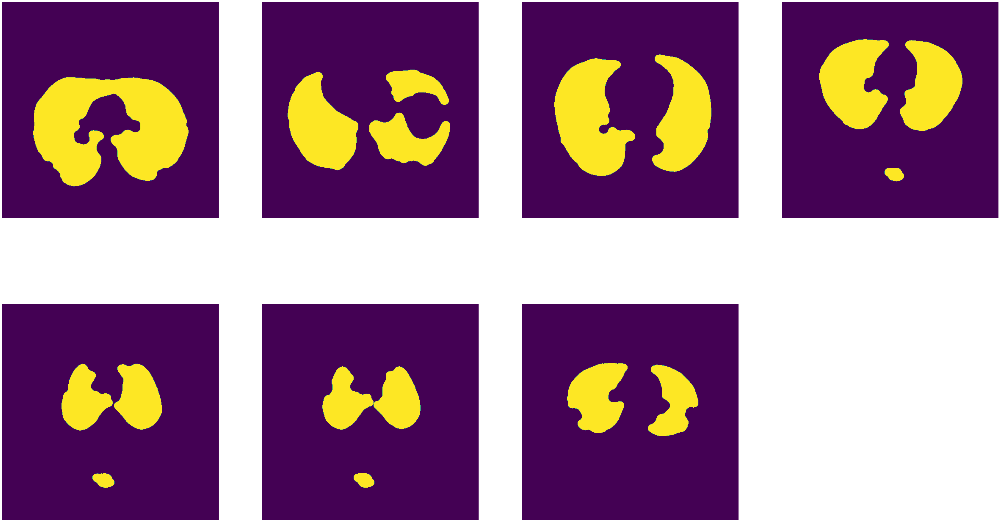

In [7]:
se_open=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(21,21))
img3_open = []
for item in img3_fill:
    img3_open.append(cv2.morphologyEx(item, cv2.MORPH_OPEN, se_open))
    
fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(img3_open)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img3_open[i])
    plt.axis('off')

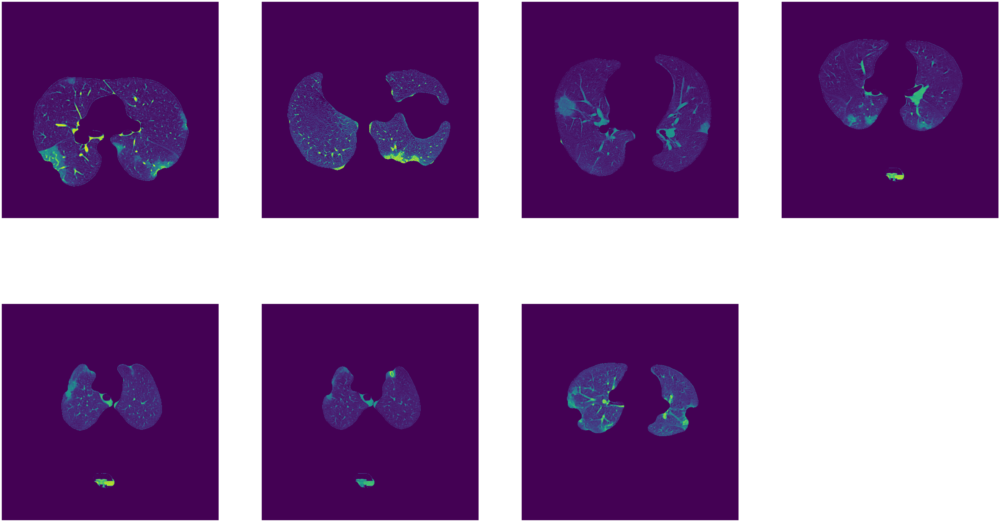

In [8]:
img4 = []
for i in range(len(img)):
    img4.append(img[i] & img3_open[i])
    
fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(img4)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(img4[i])
    plt.axis('off')

#### Binary mask corresponding to the diseased tissues

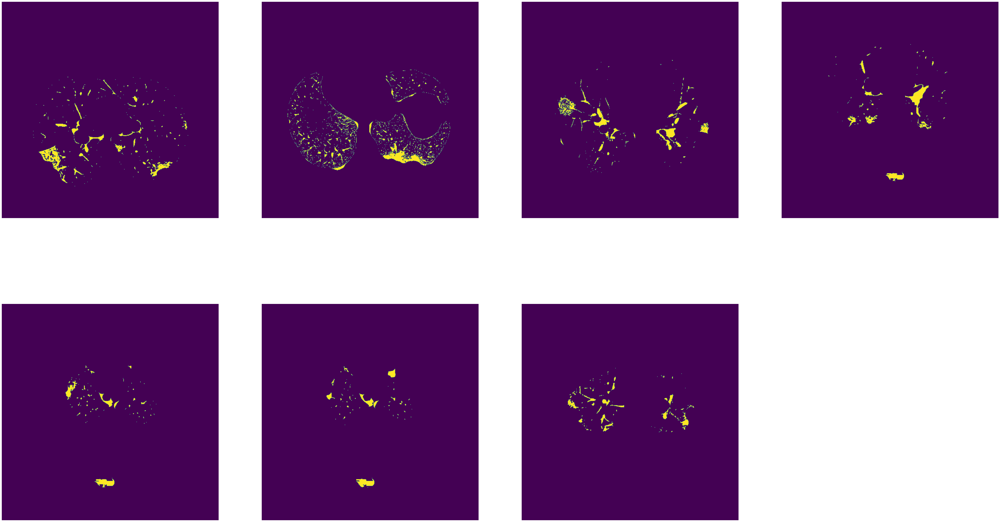

In [9]:
thres,nod_thres = [], []
for item in img4:
    thres_item,nod_thres_item = cv2.threshold(item,80,255,cv2.THRESH_BINARY)
    thres.append(thres_item)
    nod_thres.append(nod_thres_item)

fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(nod_thres)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(nod_thres[i])
    plt.axis('off')

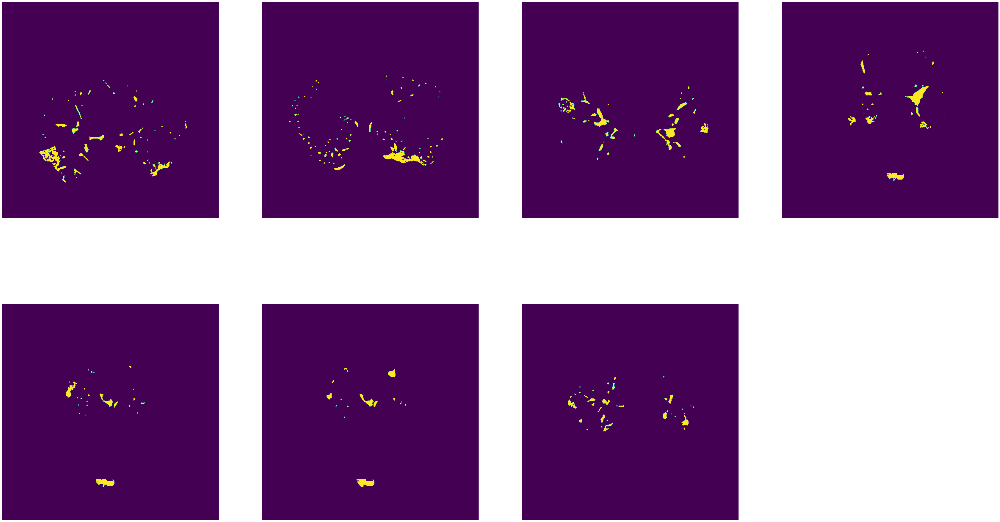

In [15]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
nodules = []
for item in nod_thres:
    open = cv2.morphologyEx(item, cv2.MORPH_OPEN, kernel)
    nodules.append(open)

fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(nodules)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(nodules[i])
    plt.axis('off')

#### RGB mask for the infected region

In [11]:
color_img = [cv2.imread(file) for file in glob.glob('C:/Users/Debprasad Kundu/Downloads/Question3//**/ct*',recursive=True)]

In [12]:
B, G, R = [], [], []
for item in color_img:
    b, g, r = cv2.split(item)
    R.append(r)
    G.append(g)
    B.append(b)

In [13]:
R_mask, G_mask, B_mask = [], [], []
for i in range(len(R)):
    R_mask.append(R[i]+300*nodules[i])
    G_mask.append(G[i]+30*nodules[i])
    B_mask.append(B[i]+40*nodules[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


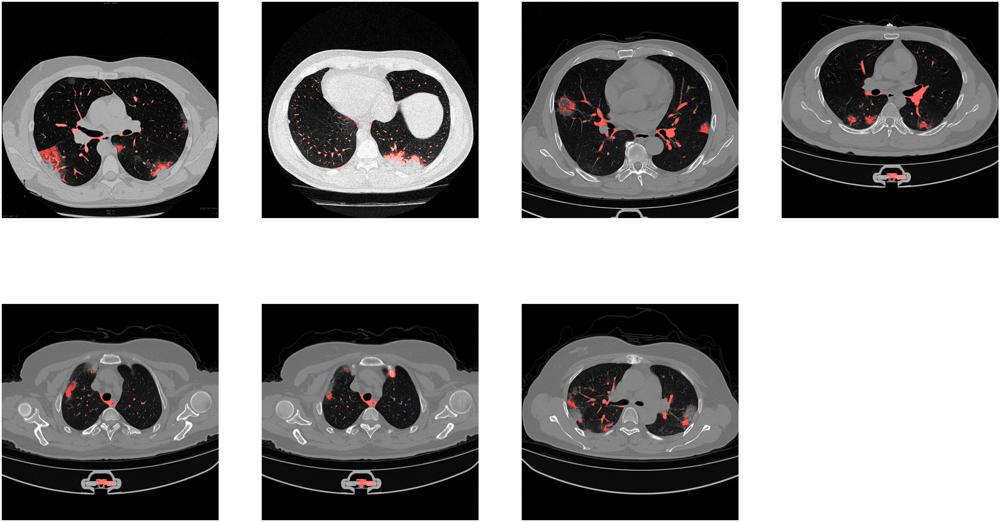

In [14]:
final_img = []
for i in range(len(img)):
    final_img.append(np.dstack((R_mask[i], G_mask[i], B_mask[i])))

fig = plt.figure(figsize=(70,40))
rows = 2
columns = 4
for i in range(len(final_img)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(final_img[i])
    plt.axis('off')